# Traffic Light Detection and Classification - Udacity CarND Capstone
Using a pre-trained model to detect objects in an image.

In [1]:
import numpy as np
import os
import sys
import tensorflow as tf
import time

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
%matplotlib inline

## Object detection imports

Here are the imports from the object detection module.

In [2]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

## Model preparation

In [34]:
ssd_mobile_sim_model = 'frozen_sim_mobile-5000/frozen_inference_graph.pb'
ssd_mobile_real_model = 'frozen_real_mobile-5000/frozen_inference_graph.pb'
ssd_inception_sim_model = 'frozen_sim_inception-5000/frozen_inference_graph.pb'
ssd_inception_real_model = 'frozen_real_inception-1000/frozen_inference_graph.pb'
#faster_rcnn_sim_model = 'frozen_models/faster_rcnn_frozen_sim/frozen_inference_graph.pb'
#faster_rcnn_real_model = 'frozen_models/faster_rcnn_frozen_real/frozen_inference_graph.pb'

PATH_TO_LABELS = 'label_map.pbtxt'

NUM_CLASSES = 4

## Loading label map

Label maps map indices to category names, so that when our convolution network predicts 2, we know that this corresponds to Red. Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine.

In [4]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(category_index)

{1: {'id': 1, 'name': 'Green'}, 2: {'id': 2, 'name': 'Red'}, 3: {'id': 3, 'name': 'Yellow'}, 4: {'id': 4, 'name': 'off'}}


In [5]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [6]:
from glob import glob

## Detection

## 1. Testing SSD Mobile Models

### 1.1 Testing model trained on simulator on simulator images

In [35]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(ssd_mobile_sim_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [36]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_sim'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_sim\*.jpg
Length of test images: 12


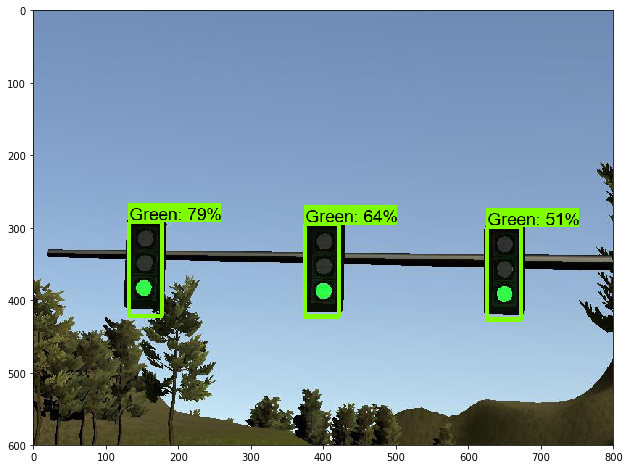

Green 0.7981602
Distance (metres) 0.0
Time in milliseconds 1279.1366577148438 

Green 0.6463811
Distance (metres) 0.0
Time in milliseconds 1279.1366577148438 

Green 0.51195025
Distance (metres) 0.0
Time in milliseconds 1279.1366577148438 



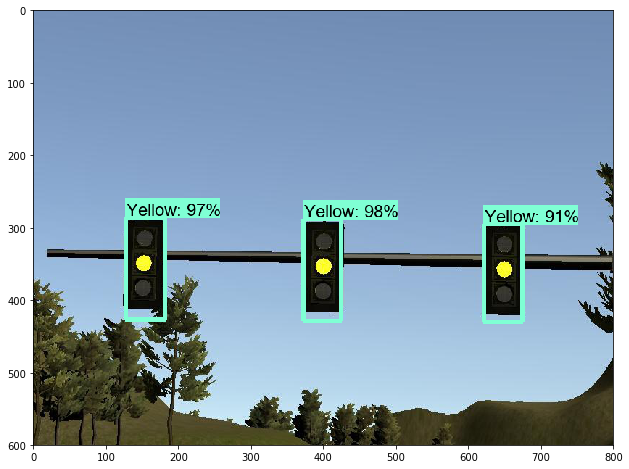

Yellow 0.9807859
Distance (metres) 0.0
Time in milliseconds 48.743486404418945 

Yellow 0.97784185
Distance (metres) 0.0
Time in milliseconds 48.743486404418945 

Yellow 0.9100041
Distance (metres) 0.0
Time in milliseconds 48.743486404418945 



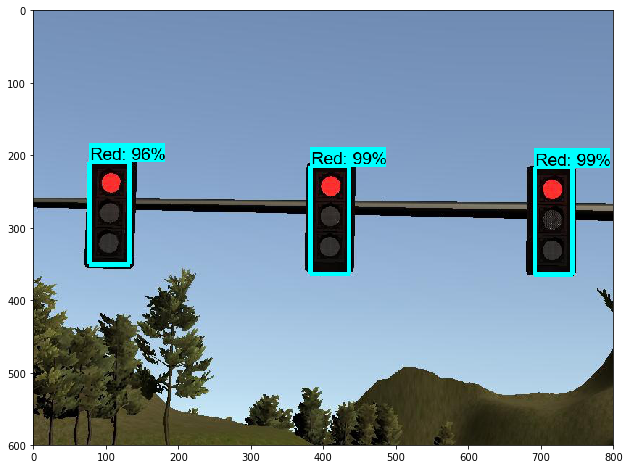

Red 0.9916579
Distance (metres) 0.0
Time in milliseconds 50.54950714111328 

Red 0.99118805
Distance (metres) 0.0
Time in milliseconds 50.54950714111328 

Red 0.96292114
Distance (metres) 0.0
Time in milliseconds 50.54950714111328 



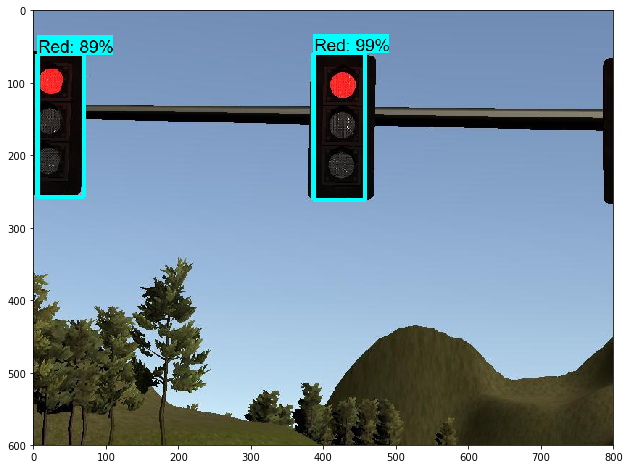

Red 0.9941596
Distance (metres) 0.0
Time in milliseconds 52.03819274902344 

Red 0.8995471
Distance (metres) 0.0
Time in milliseconds 52.03819274902344 



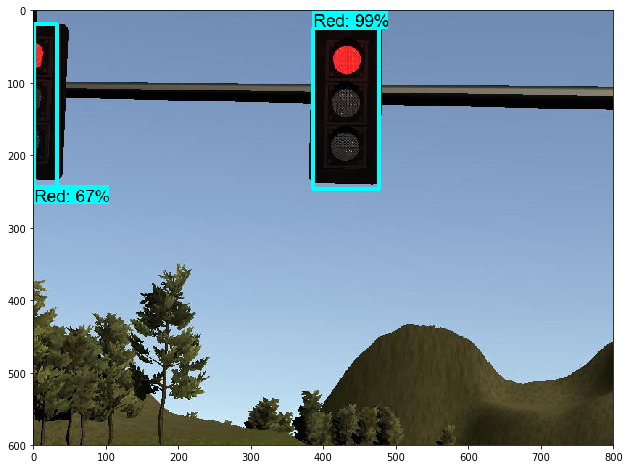

Red 0.9974517
Distance (metres) 0.0
Time in milliseconds 49.66139793395996 

Red 0.6775965
Distance (metres) 0.0
Time in milliseconds 49.66139793395996 



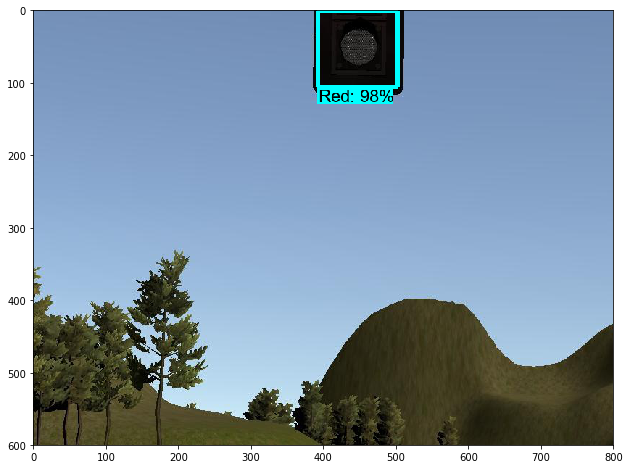

Red 0.9882429
Distance (metres) 0.0
Time in milliseconds 49.03411865234375 



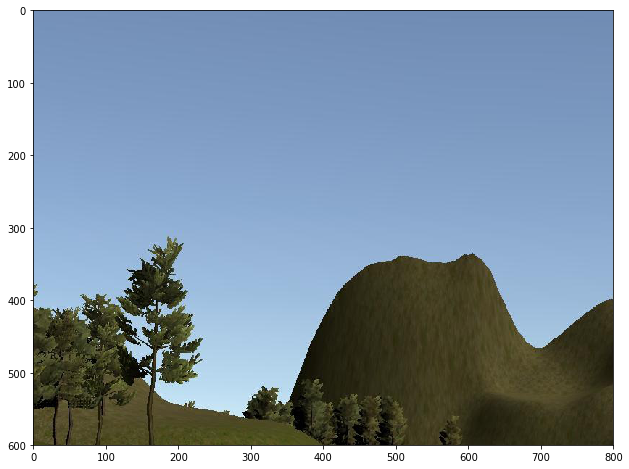

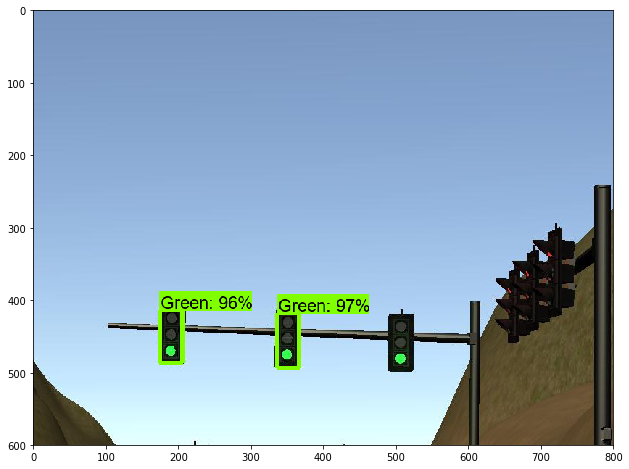

Green 0.97899836
Distance (metres) 0.0
Time in milliseconds 46.06127738952637 

Green 0.96037656
Distance (metres) 0.0
Time in milliseconds 46.06127738952637 



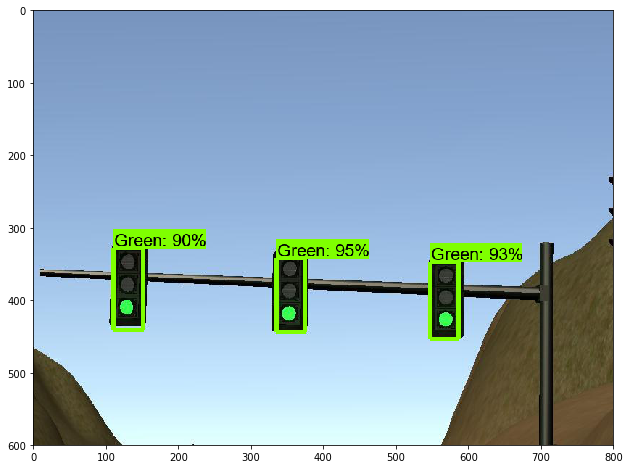

Green 0.9596344
Distance (metres) 0.0
Time in milliseconds 49.54123497009277 

Green 0.9384158
Distance (metres) 0.0
Time in milliseconds 49.54123497009277 

Green 0.90922284
Distance (metres) 0.0
Time in milliseconds 49.54123497009277 



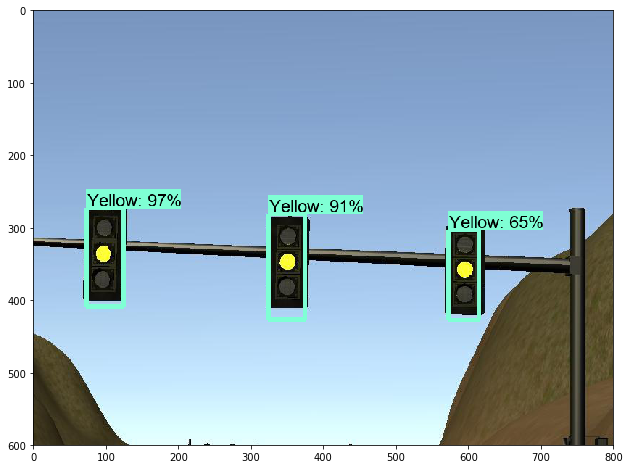

Yellow 0.9731407
Distance (metres) 0.0
Time in milliseconds 49.03984069824219 

Yellow 0.91248465
Distance (metres) 0.0
Time in milliseconds 49.03984069824219 

Yellow 0.65719503
Distance (metres) 0.0
Time in milliseconds 49.03984069824219 



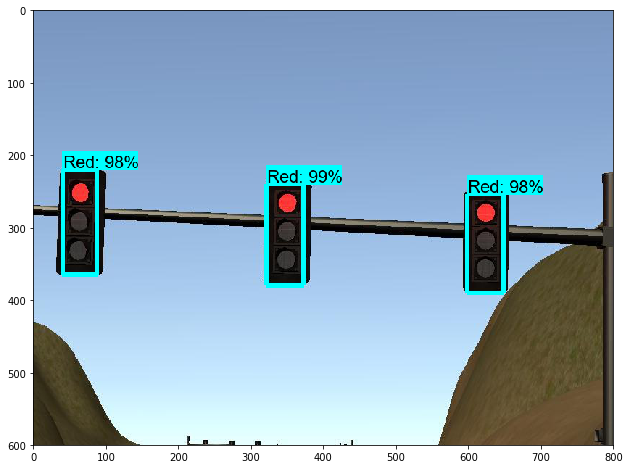

Red 0.99536705
Distance (metres) 0.0
Time in milliseconds 48.08974266052246 

Red 0.98736644
Distance (metres) 0.0
Time in milliseconds 48.08974266052246 

Red 0.98453796
Distance (metres) 0.0
Time in milliseconds 48.08974266052246 



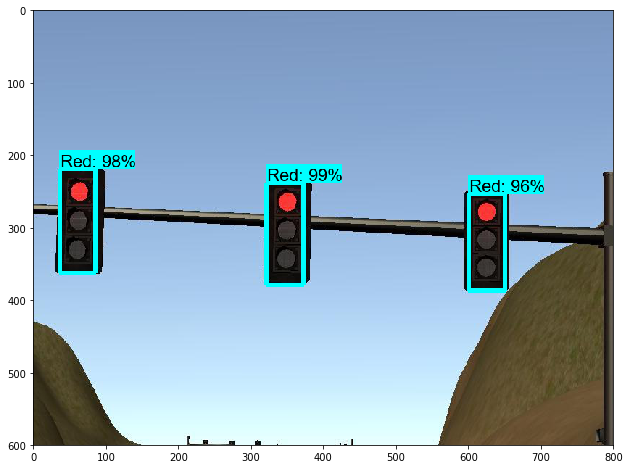

Red 0.99696475
Distance (metres) 0.0
Time in milliseconds 48.03800582885742 

Red 0.98530585
Distance (metres) 0.0
Time in milliseconds 48.03800582885742 

Red 0.9660972
Distance (metres) 0.0
Time in milliseconds 48.03800582885742 



In [37]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  0.97428
                    fy =  1.73205
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n") 

### 1.2 Testing model trained on real images on Real World images

In [16]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(ssd_inception_real_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [17]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_udacity'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_udacity/*.jpg
Length of test images: 9


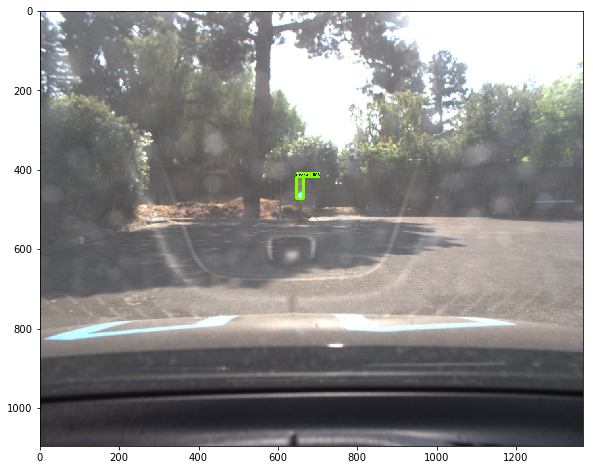

Green 0.999737
Distance (metres) 13.0
Time in milliseconds 1022.979736328125 



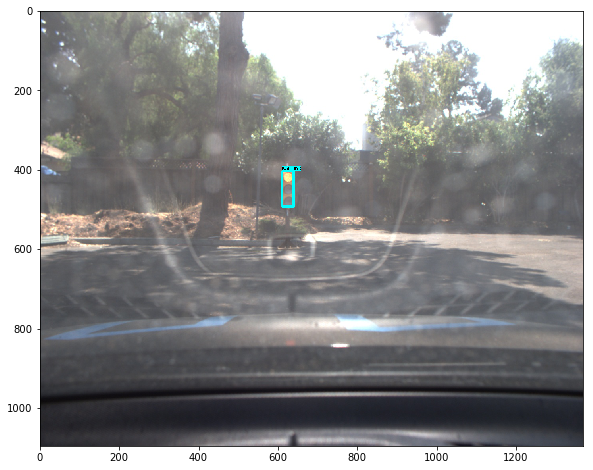

Red 0.999607
Distance (metres) 8.0
Time in milliseconds 53.27868461608887 



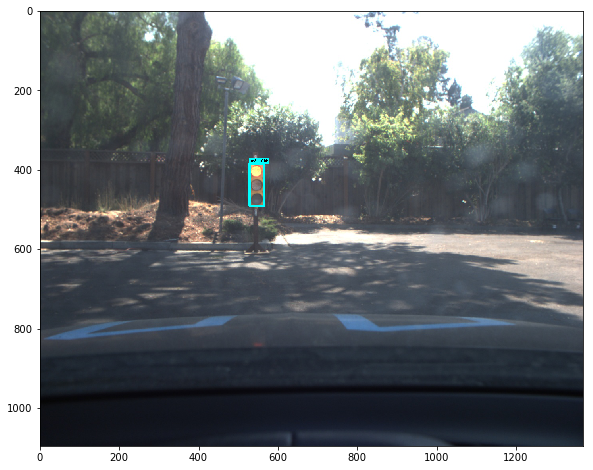

Red 0.999529
Distance (metres) 7.0
Time in milliseconds 56.12826347351074 



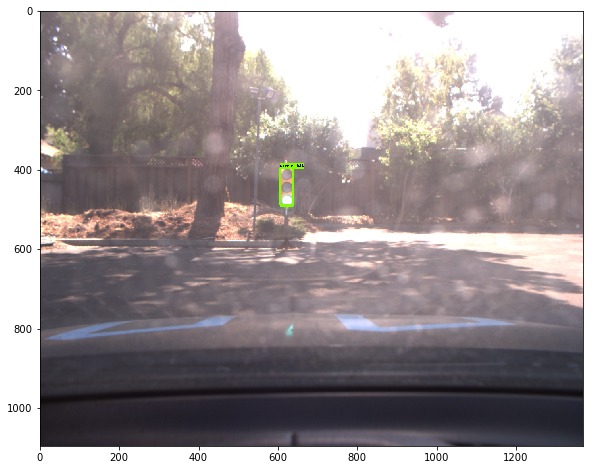

Green 0.999028
Distance (metres) 7.0
Time in milliseconds 54.473161697387695 



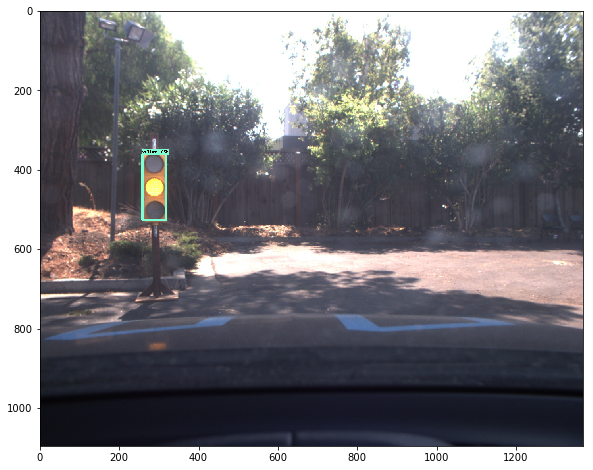

Yellow 0.6531
Distance (metres) 4.0
Time in milliseconds 55.39560317993164 



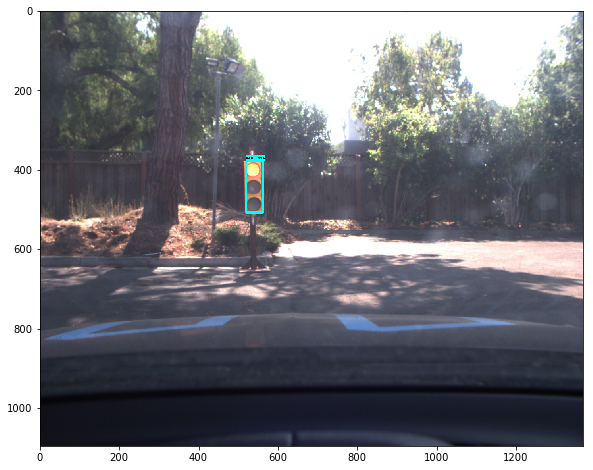

Red 0.999498
Distance (metres) 6.0
Time in milliseconds 53.511619567871094 



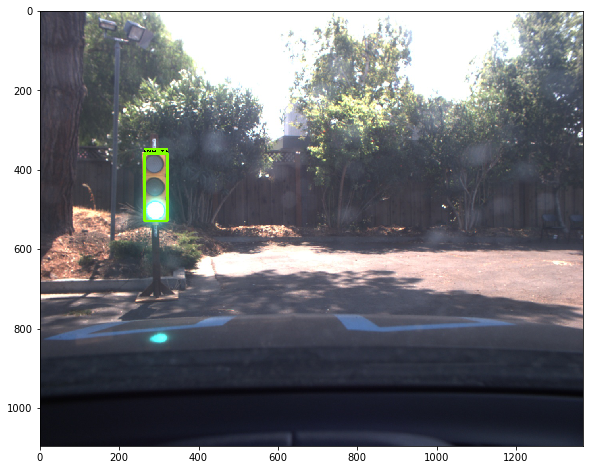

Green 0.993744
Distance (metres) 4.0
Time in milliseconds 56.115150451660156 



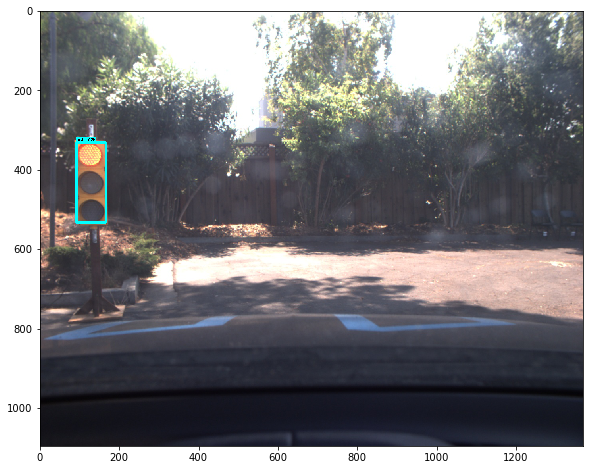

Red 0.975729
Distance (metres) 3.0
Time in milliseconds 53.85255813598633 



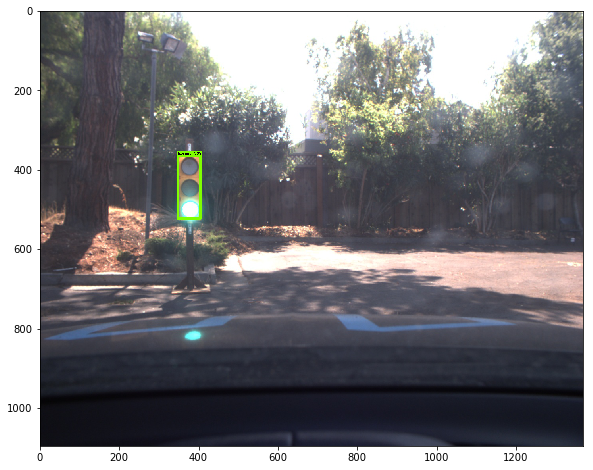

Green 0.998916
Distance (metres) 4.0
Time in milliseconds 53.83467674255371 



In [18]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  1345.200806
                    fy =  1353.838257
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n")

## 1. Testing SSD Inception Models

### 1.1 Testing model trained on simulator on simulator images

In [31]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(ssd_inception_sim_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [32]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_sim'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_sim\*.jpg
Length of test images: 12


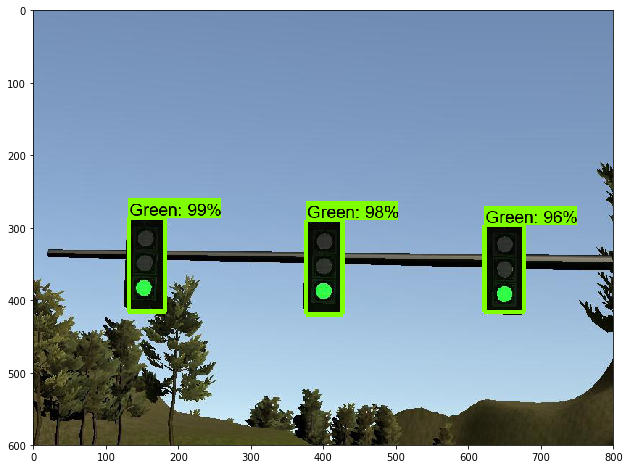

Green 0.992964
Distance (metres) 0.0
Time in milliseconds 1595.8645343780518 

Green 0.9818024
Distance (metres) 0.0
Time in milliseconds 1595.8645343780518 

Green 0.96377325
Distance (metres) 0.0
Time in milliseconds 1595.8645343780518 



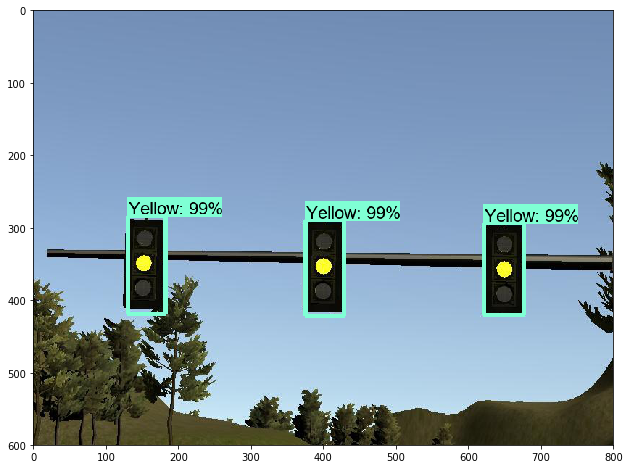

Yellow 0.99685574
Distance (metres) 0.0
Time in milliseconds 90.60192108154297 

Yellow 0.99615234
Distance (metres) 0.0
Time in milliseconds 90.60192108154297 

Yellow 0.9957223
Distance (metres) 0.0
Time in milliseconds 90.60192108154297 



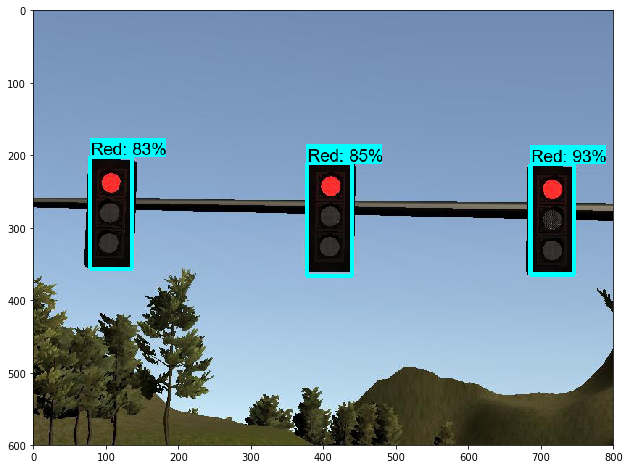

Red 0.9337915
Distance (metres) 0.0
Time in milliseconds 105.58438301086426 

Red 0.85300714
Distance (metres) 0.0
Time in milliseconds 105.58438301086426 

Red 0.8346732
Distance (metres) 0.0
Time in milliseconds 105.58438301086426 



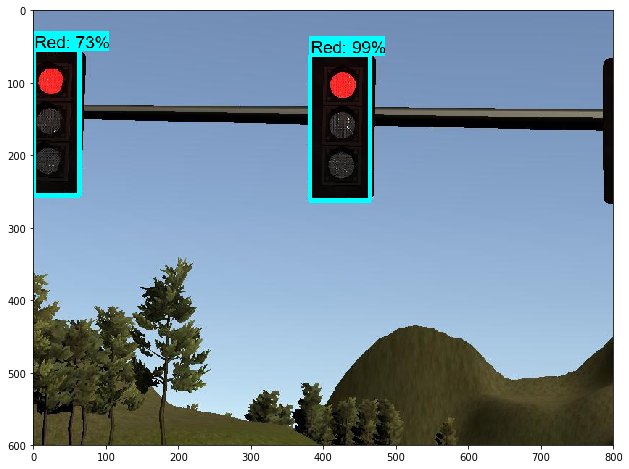

Red 0.9948513
Distance (metres) 0.0
Time in milliseconds 89.06698226928711 

Red 0.7317068
Distance (metres) 0.0
Time in milliseconds 89.06698226928711 



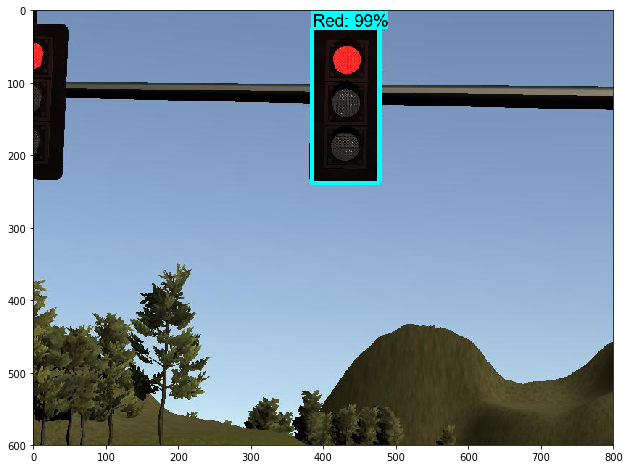

Red 0.9962655
Distance (metres) 0.0
Time in milliseconds 88.06777000427246 



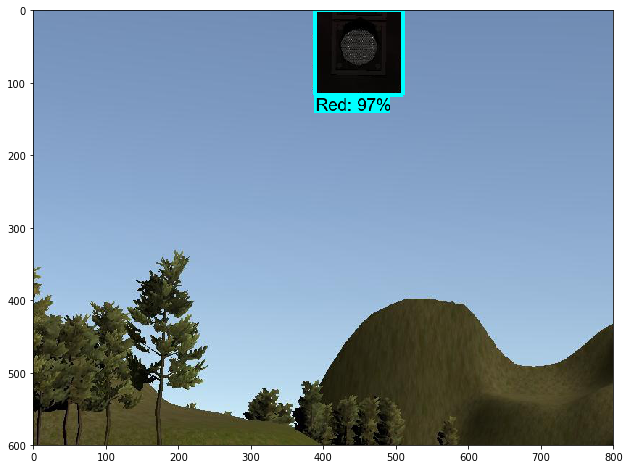

Red 0.97752553
Distance (metres) 0.0
Time in milliseconds 93.7199592590332 



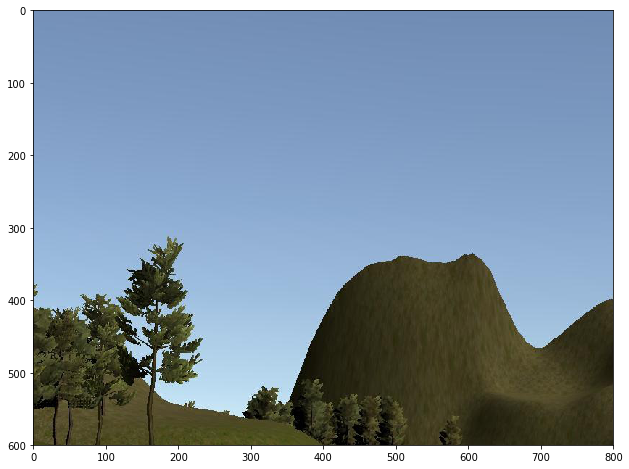

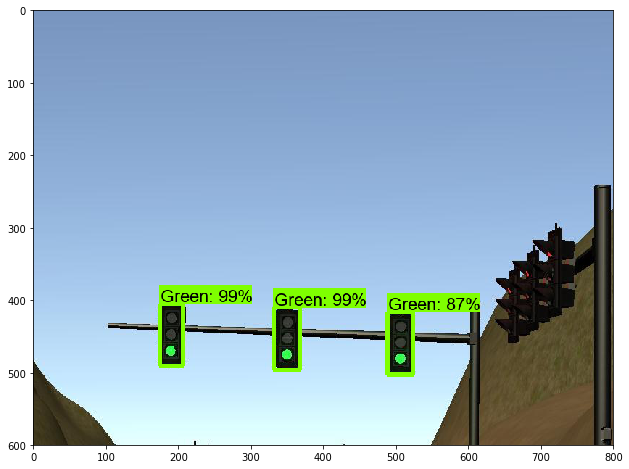

Green 0.9990024
Distance (metres) 0.0
Time in milliseconds 88.07039260864258 

Green 0.9989666
Distance (metres) 0.0
Time in milliseconds 88.07039260864258 

Green 0.8741852
Distance (metres) 0.0
Time in milliseconds 88.07039260864258 



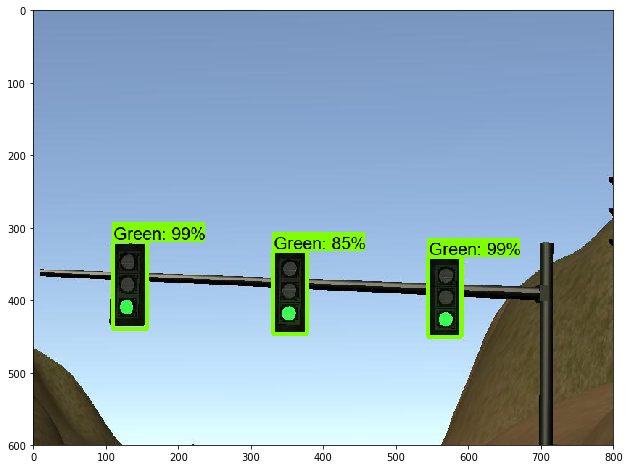

Green 0.9983512
Distance (metres) 0.0
Time in milliseconds 88.06490898132324 

Green 0.9976654
Distance (metres) 0.0
Time in milliseconds 88.06490898132324 

Green 0.8592437
Distance (metres) 0.0
Time in milliseconds 88.06490898132324 



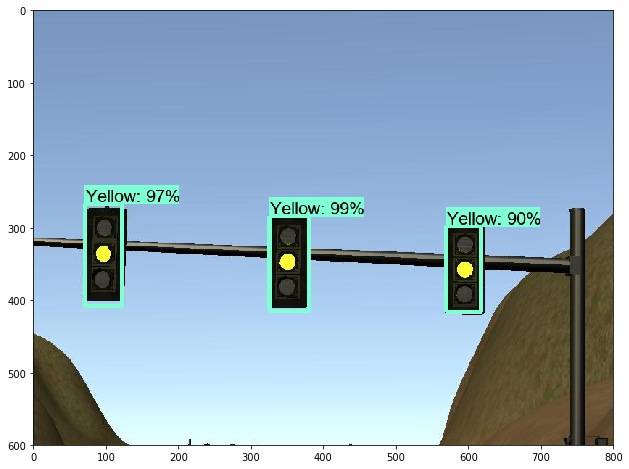

Yellow 0.99748516
Distance (metres) 0.0
Time in milliseconds 87.65077590942383 

Yellow 0.9762007
Distance (metres) 0.0
Time in milliseconds 87.65077590942383 

Yellow 0.90720904
Distance (metres) 0.0
Time in milliseconds 87.65077590942383 



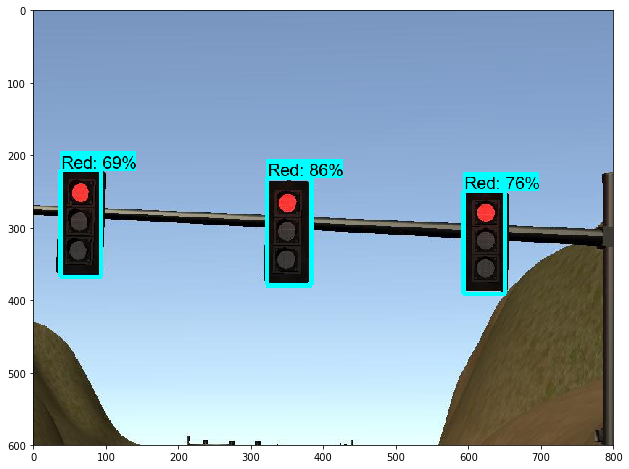

Red 0.866621
Distance (metres) 0.0
Time in milliseconds 88.06681632995605 

Red 0.7680044
Distance (metres) 0.0
Time in milliseconds 88.06681632995605 

Red 0.6981982
Distance (metres) 0.0
Time in milliseconds 88.06681632995605 



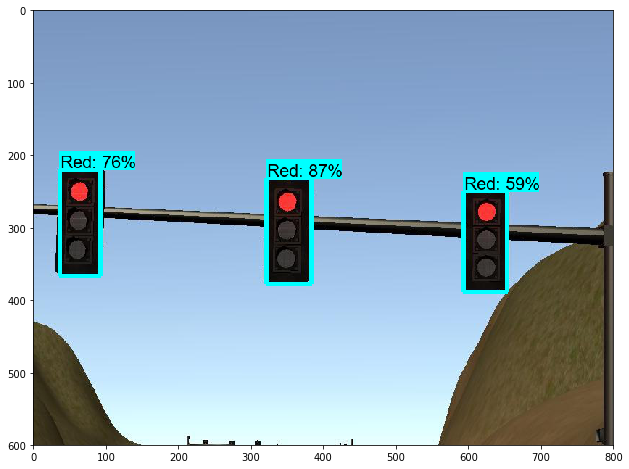

Red 0.8751476
Distance (metres) 0.0
Time in milliseconds 88.06705474853516 

Red 0.7608739
Distance (metres) 0.0
Time in milliseconds 88.06705474853516 

Red 0.5933274
Distance (metres) 0.0
Time in milliseconds 88.06705474853516 



In [33]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  0.97428
                    fy =  1.73205
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n") 

### 1.2 Testing model trained on real images on Real World images

In [19]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(ssd_inception_real_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [20]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_udacity'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_udacity\*.jpg
Length of test images: 9


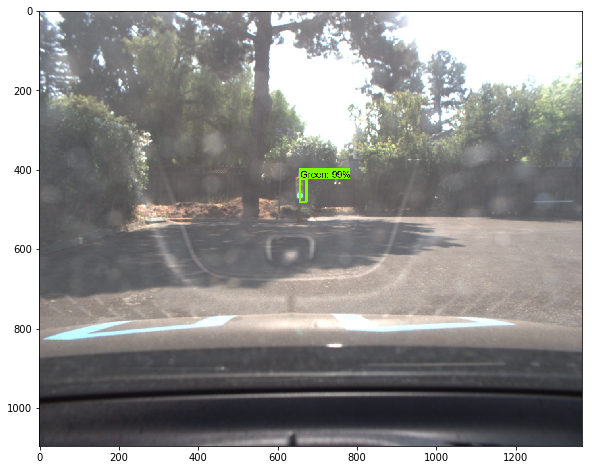

Green 0.99743253
Distance (metres) 13.0
Time in milliseconds 4334.524869918823 



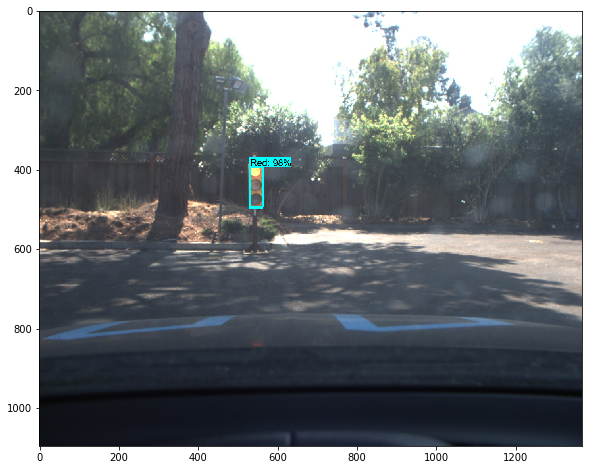

Red 0.98378193
Distance (metres) 7.0
Time in milliseconds 119.12918090820312 



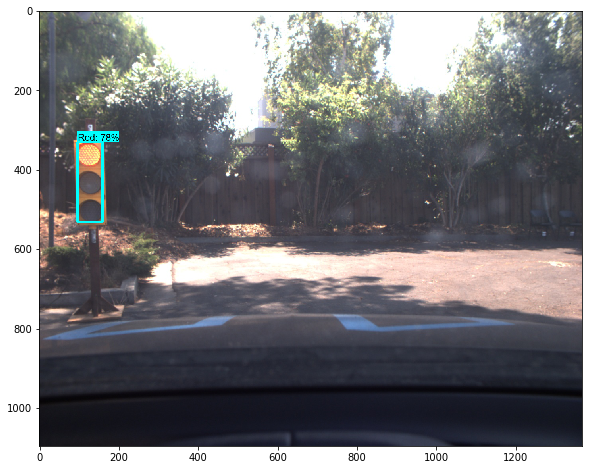

Red 0.7818871
Distance (metres) 4.0
Time in milliseconds 135.0996494293213 



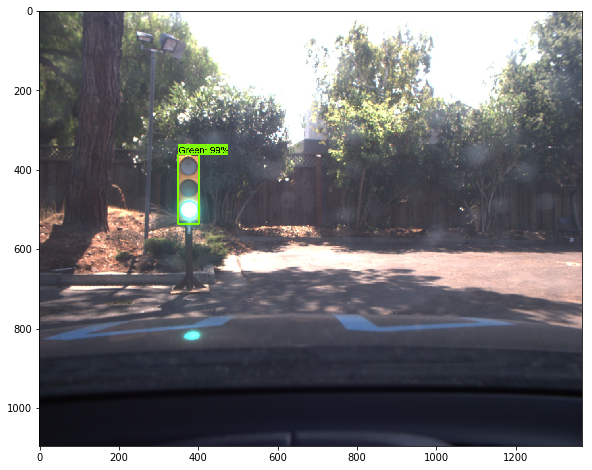

Green 0.9948782
Distance (metres) 4.0
Time in milliseconds 134.1102123260498 



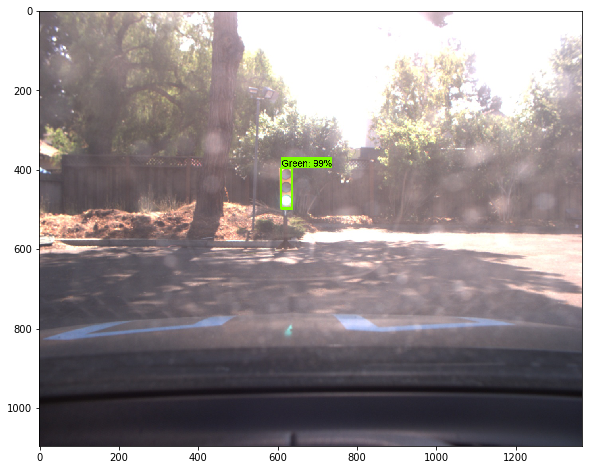

Green 0.9964335
Distance (metres) 8.0
Time in milliseconds 105.5760383605957 



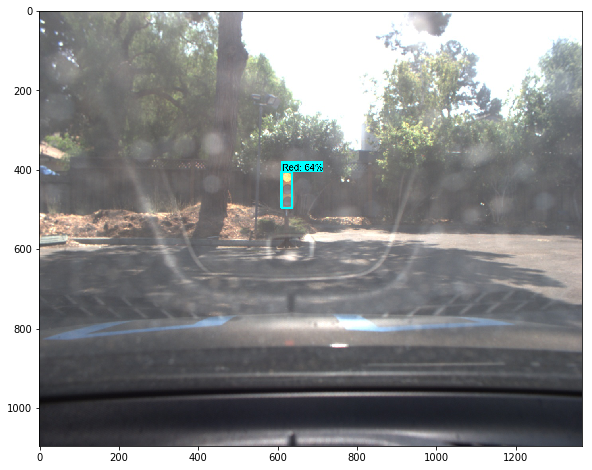

Red 0.6417099
Distance (metres) 8.0
Time in milliseconds 121.10424041748047 



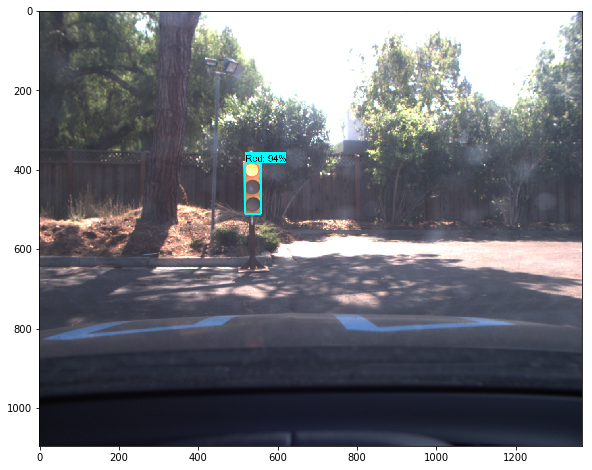

Red 0.94349855
Distance (metres) 6.0
Time in milliseconds 125.10967254638672 



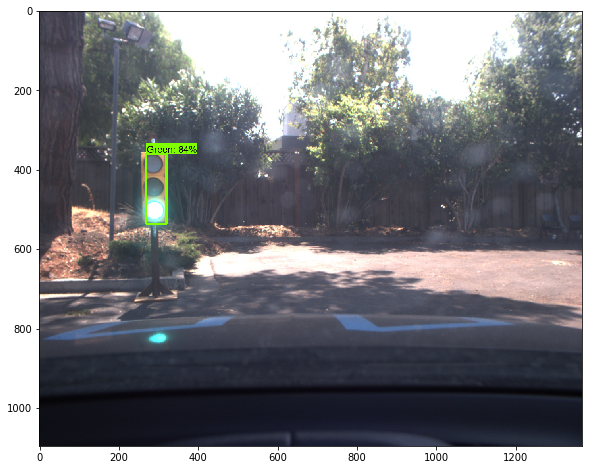

Green 0.8410612
Distance (metres) 4.0
Time in milliseconds 128.1120777130127 



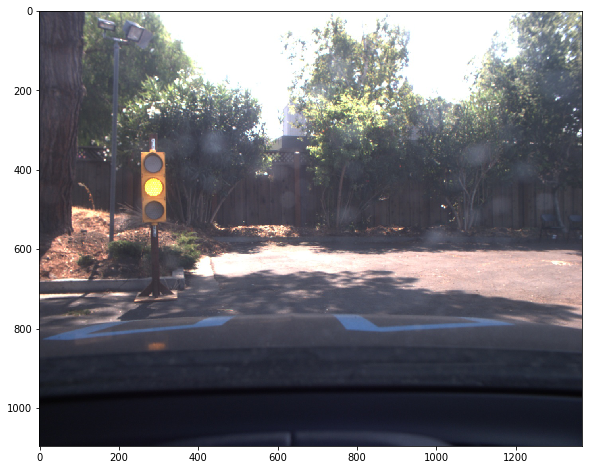

In [21]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  1345.200806
                    fy =  1353.838257
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n")

## 2. Testing Faster RCNN Models

### 2.1 Testing model trained on simulator on simulator images

In [23]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(faster_rcnn_sim_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [24]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_sim'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_sim/*.jpg
Length of test images: 12


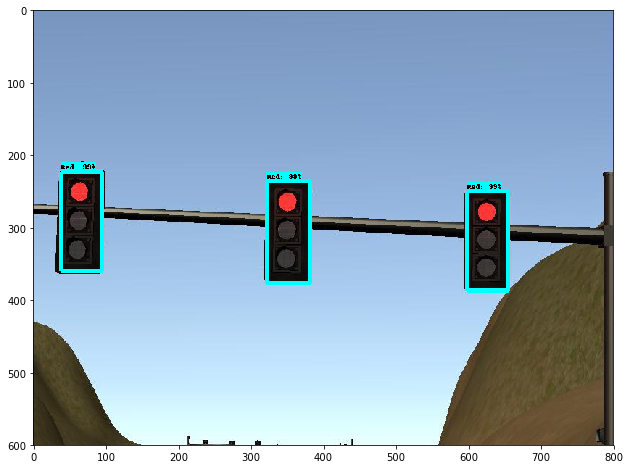

Red 0.995509
Distance (metres) 0.0
Time in milliseconds 3260.998010635376 

Red 0.994898
Distance (metres) 0.0
Time in milliseconds 3260.998010635376 

Red 0.993326
Distance (metres) 0.0
Time in milliseconds 3260.998010635376 



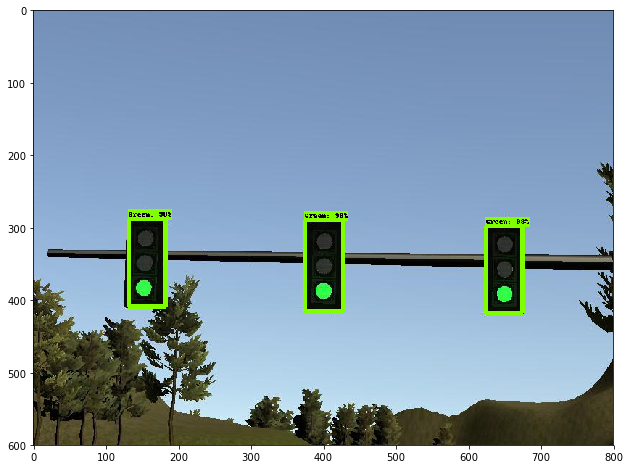

Green 0.987453
Distance (metres) 0.0
Time in milliseconds 169.19374465942383 

Green 0.985762
Distance (metres) 0.0
Time in milliseconds 169.19374465942383 

Green 0.983336
Distance (metres) 0.0
Time in milliseconds 169.19374465942383 



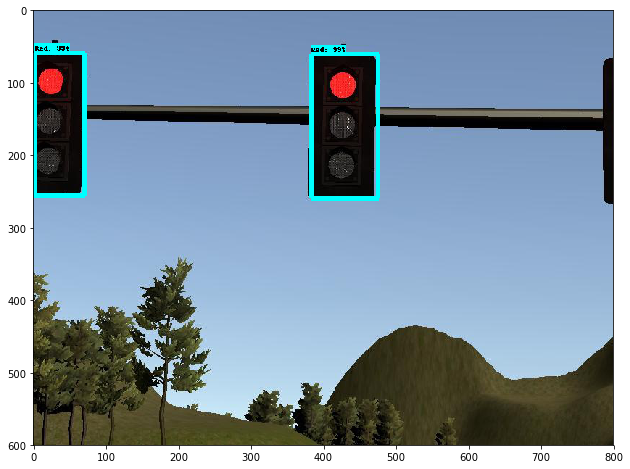

Red 0.993831
Distance (metres) 0.0
Time in milliseconds 159.7440242767334 

Red 0.993808
Distance (metres) 0.0
Time in milliseconds 159.7440242767334 



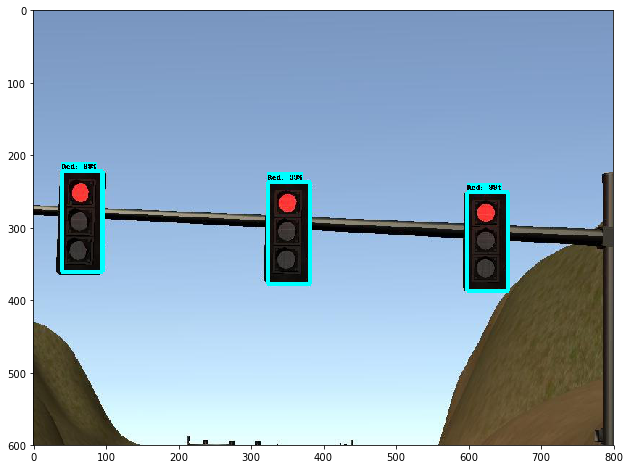

Red 0.996058
Distance (metres) 0.0
Time in milliseconds 154.58226203918457 

Red 0.995183
Distance (metres) 0.0
Time in milliseconds 154.58226203918457 

Red 0.993674
Distance (metres) 0.0
Time in milliseconds 154.58226203918457 



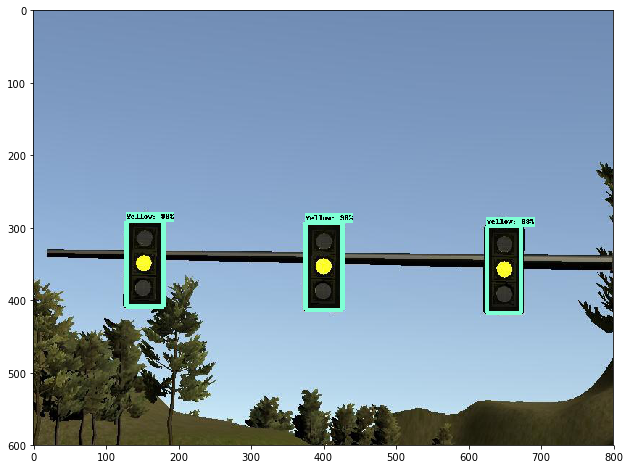

Yellow 0.997202
Distance (metres) 0.0
Time in milliseconds 155.5495262145996 

Yellow 0.988186
Distance (metres) 0.0
Time in milliseconds 155.5495262145996 

Yellow 0.981048
Distance (metres) 0.0
Time in milliseconds 155.5495262145996 



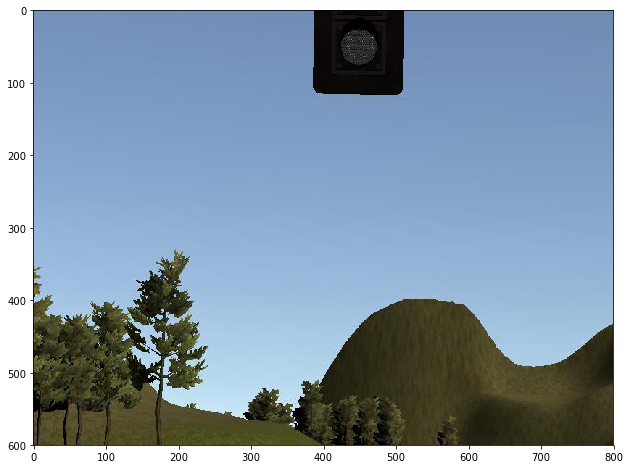

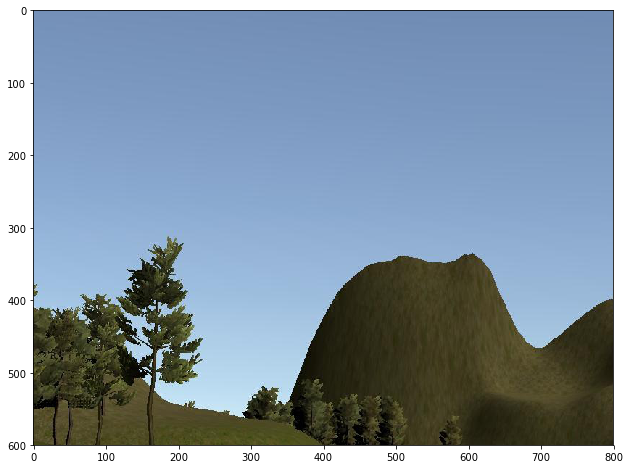

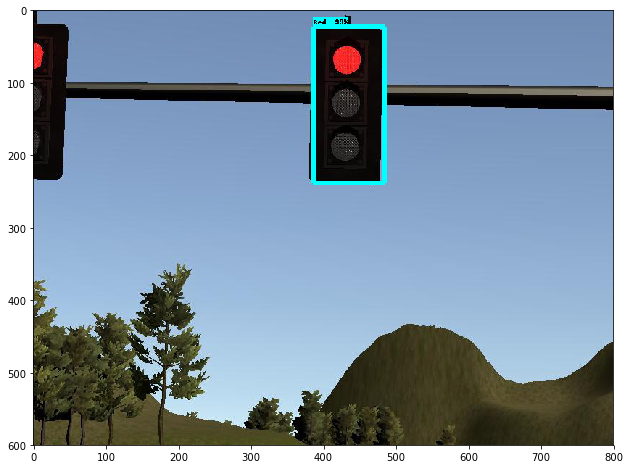

Red 0.993295
Distance (metres) 0.0
Time in milliseconds 155.22336959838867 



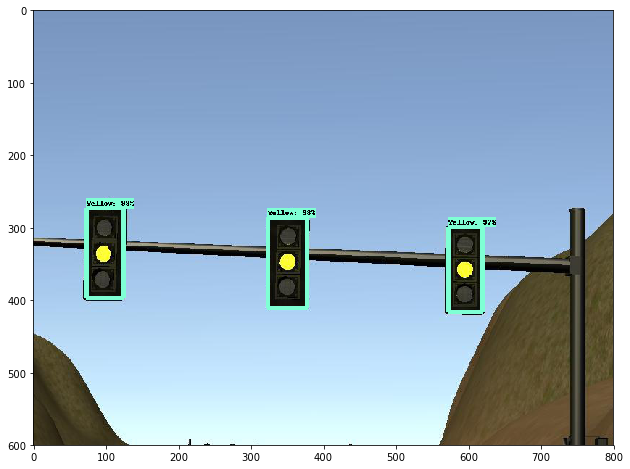

Yellow 0.988352
Distance (metres) 0.0
Time in milliseconds 155.89213371276855 

Yellow 0.985127
Distance (metres) 0.0
Time in milliseconds 155.89213371276855 

Yellow 0.97351
Distance (metres) 0.0
Time in milliseconds 155.89213371276855 



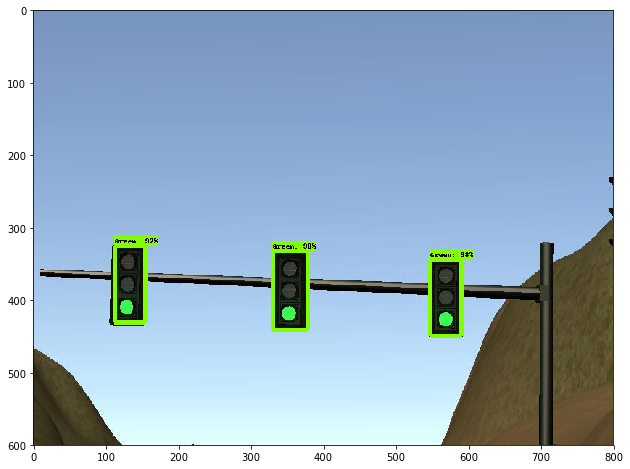

Green 0.987782
Distance (metres) 0.0
Time in milliseconds 155.69376945495605 

Green 0.987745
Distance (metres) 0.0
Time in milliseconds 155.69376945495605 

Green 0.979698
Distance (metres) 0.0
Time in milliseconds 155.69376945495605 



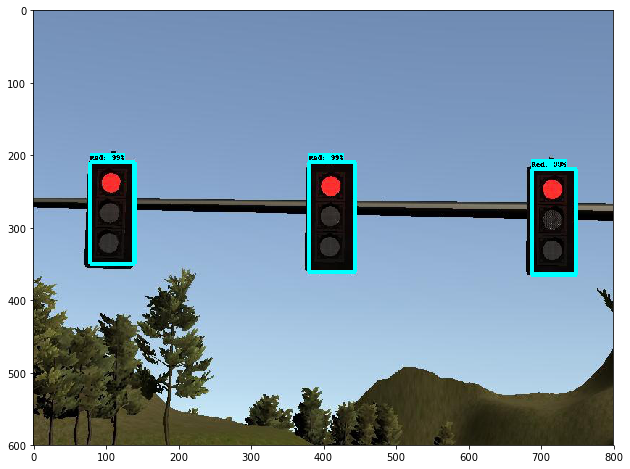

Red 0.997681
Distance (metres) 0.0
Time in milliseconds 155.0748348236084 

Red 0.997158
Distance (metres) 0.0
Time in milliseconds 155.0748348236084 

Red 0.995504
Distance (metres) 0.0
Time in milliseconds 155.0748348236084 



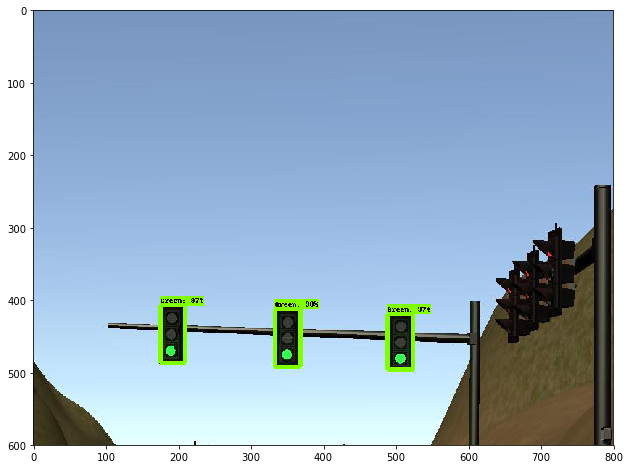

Green 0.986278
Distance (metres) 0.0
Time in milliseconds 154.82354164123535 

Green 0.9739
Distance (metres) 0.0
Time in milliseconds 154.82354164123535 

Green 0.971095
Distance (metres) 0.0
Time in milliseconds 154.82354164123535 



In [25]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  0.97428
                    fy =  1.73205
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n") 

### 2.2 Testing model trained on real images on Real World images

In [26]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(faster_rcnn_real_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [27]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_udacity'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_udacity/*.jpg
Length of test images: 9


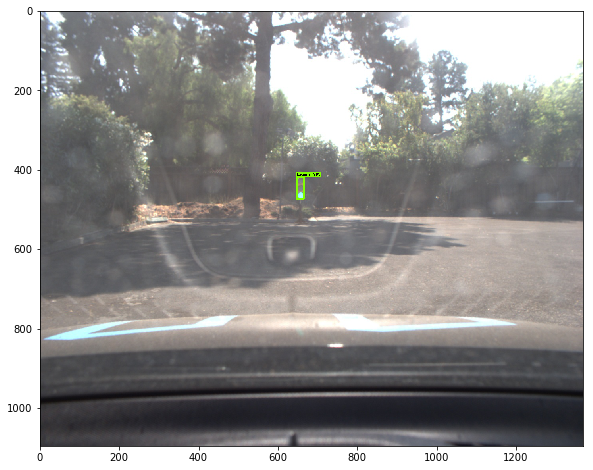

Green 0.99827
Distance (metres) 13.0
Time in milliseconds 3328.2885551452637 



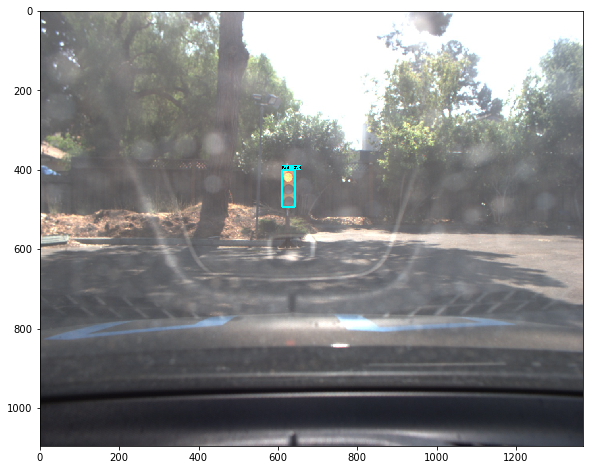

Red 0.99843
Distance (metres) 8.0
Time in milliseconds 410.22300720214844 



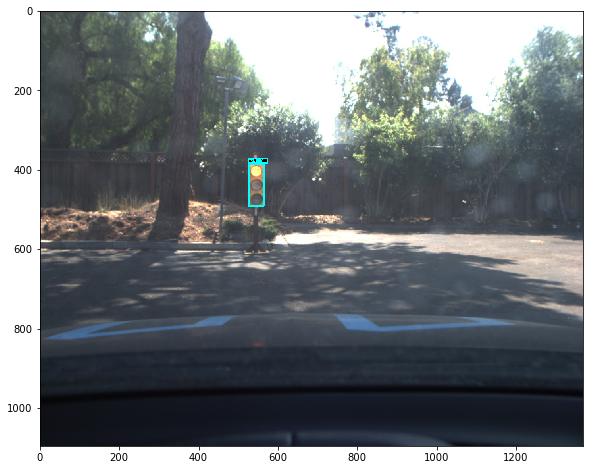

Red 0.998801
Distance (metres) 6.0
Time in milliseconds 380.94210624694824 



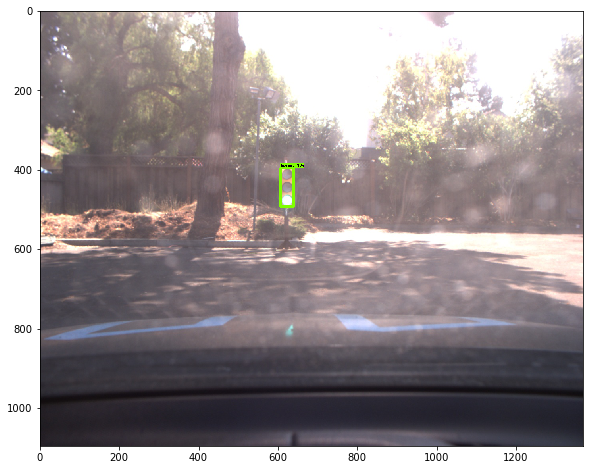

Green 0.999449
Distance (metres) 7.0
Time in milliseconds 378.5581588745117 



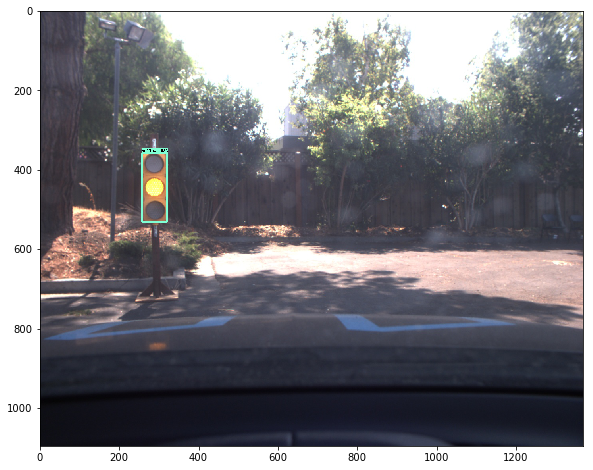

Yellow 0.99949
Distance (metres) 4.0
Time in milliseconds 387.96162605285645 



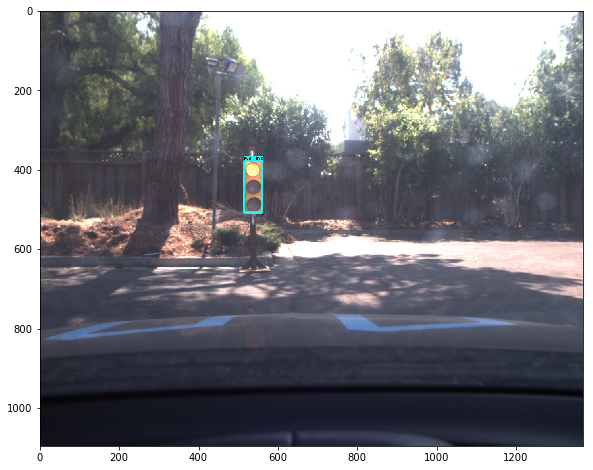

Red 0.999456
Distance (metres) 5.0
Time in milliseconds 393.0554389953613 



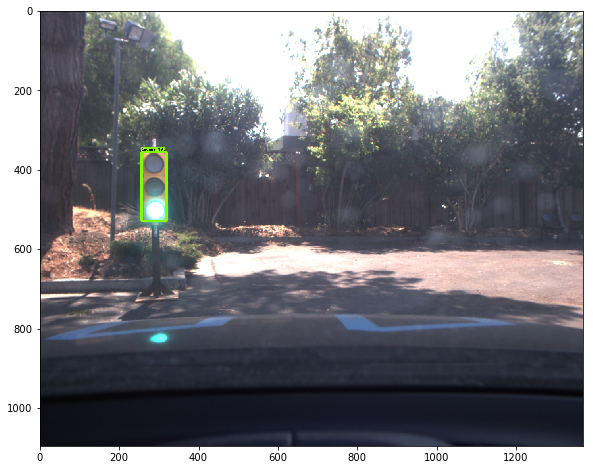

Green 0.998733
Distance (metres) 4.0
Time in milliseconds 397.3538875579834 



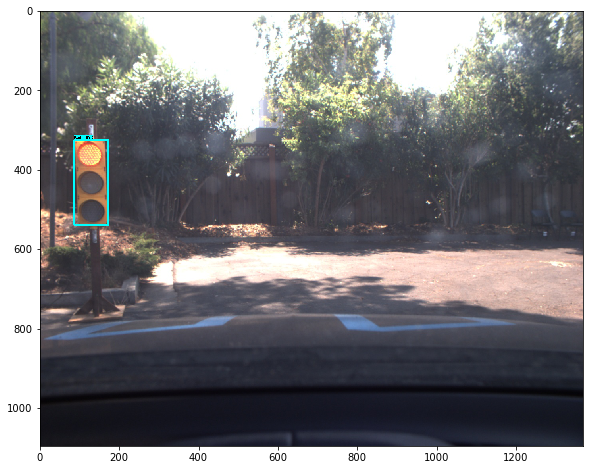

Red 0.999245
Distance (metres) 3.0
Time in milliseconds 382.9150199890137 



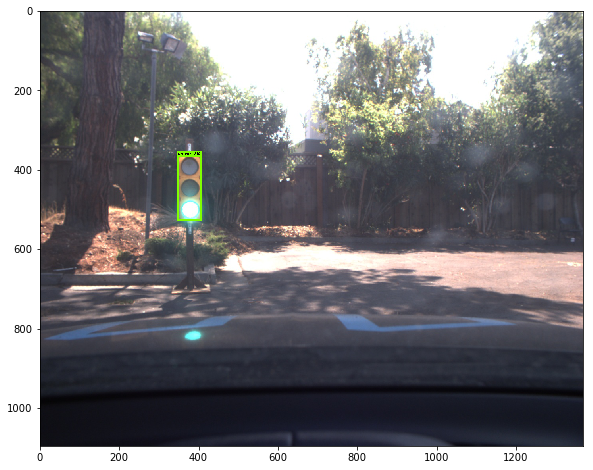

Green 0.999599
Distance (metres) 4.0
Time in milliseconds 388.6592388153076 



In [28]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  1345.200806
                    fy =  1353.838257
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n")